## Brain Observatory Monitor
This notebook demonstrates how to query an BrainObservatoryDataNwbDataSet object to find out what type of stimulus was on the monitor at a given acquisiton frame during an experiment, and align that stimulus on the monitor with stimulus templates from other parts of a session (or other sessions in a container).

In [68]:
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import allensdk.brain_observatory.stimulus_info as si
from allensdk.core.brain_observatory_cache import BrainObservatoryCache
boc =  BrainObservatoryCache(manifest_file='boc/manifest.json')
import scipy.optimize as sopt

This dataframe summarizes the epochs of the experiment, and their start and end acquisition frames:

In [2]:
nwb_dataset = boc.get_ophys_experiment_data(527550473)
nwb_dataset.get_stimulus_epoch_table()

2018-08-09 16:03:10,183 allensdk.api.api.retrieve_file_over_http INFO     Downloading URL: http://api.brain-map.org/api/v2/well_known_file_download/528017428


,stimulus,start,end
0,locally_sparse_noise,742,22417
1,spontaneous,22567,31449
2,natural_movie_one,31450,40479
3,locally_sparse_noise,41385,63058
4,natural_movie_two,63962,72991
5,spontaneous,73141,82023
6,locally_sparse_noise,82024,105502


To get the stimulus parameters shown on acquisition frame 1010:

In [3]:
params, template = nwb_dataset.get_stimulus(1010)
pd.Series(params[2])

/home/nicholasc/projects/allensdk/allensdk/core/brain_observatory_nwb_data_set.py:545: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  new_table = pd.concat(table_list)


end                         1013
frame                         35
repeat                       NaN
start                       1006
stimulus    locally_sparse_noise
dtype: object

This is what was on the moniter during that acquision frame:

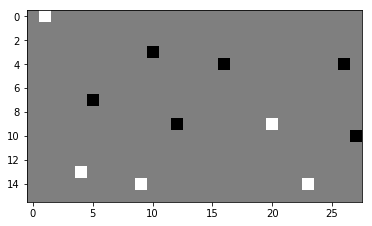

In [4]:
img = plt.imshow(template, cmap=plt.cm.gray, interpolation='none')

Sometimes it is nice to have this stimulus visualized exactly as it was shown on the monitor:

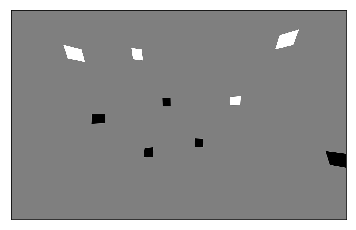

In [5]:
m = si.BrainObservatoryMonitor()
img_screen = m.lsn_image_to_screen(template)
m.show_image(img_screen, warp=True)

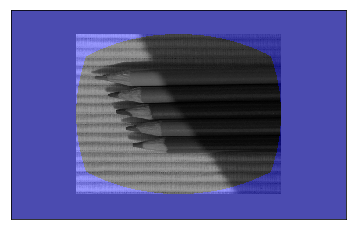

In [18]:
nwb_dataset = boc.get_ophys_experiment_data(511458874)
template = nwb_dataset.get_stimulus_template(si.NATURAL_SCENES)
img_screen = m.natural_scene_image_to_screen(template[114,:,:])
m.show_image(img_screen, warp=False, mask=True)

In [78]:
template.shape

(118, 918, 1174)

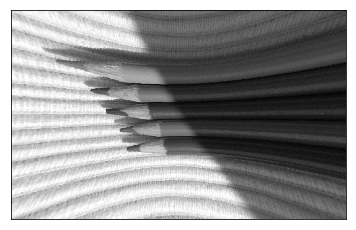

In [100]:
# for ii in range(1):

fig, ax = plt.subplots(1,1)
nwb_dataset = boc.get_ophys_experiment_data(511458874)
template = nwb_dataset.get_stimulus_template(si.NATURAL_SCENES).astype(np.uint8)
img_screen = m.natural_scene_image_to_screen(template[114,:,:])
m.show_image(img_screen, ax=ax, warp=True, mask=False, show=False)
data = [obj for obj in ax.get_children() if isinstance(obj, mpl.image.AxesImage)][0].get_array()
# data.shape
data = data*127./data.mean()
# data.mean()
data = data.astype(np.uint8)

# tmp = np.array([img_screen])
tmp = np.array([data[::2,::2][::-1,:]])
np.save('/allen/aibs/technology/nicholasc/openscope/pencil_lum_match.npy', tmp)

In [251]:

import skimage.exposure

In [99]:
nwb_dataset = boc.get_ophys_experiment_data(511458874)
template = nwb_dataset.get_stimulus_template(si.NATURAL_SCENES).astype(np.uint8)
tmp = np.zeros((template.shape[0], 1200/2, 1920/2), dtype=np.uint8)
for ii in range(template.shape[0]):


    fig, ax = plt.subplots(1,1)


    img_screen = m.natural_scene_image_to_screen(template[ii,:,:])
    print ii, img_screen.mean()
    m.show_image(img_screen, ax=ax, warp=True, mask=False, show=False)
    data = [obj for obj in ax.get_children() if isinstance(obj, mpl.image.AxesImage)][0].get_array()
    # data.shape
    data = data*127./data.mean()
    # data.mean()
    tmp[ii,:,:] = data[::2,::2][::-1,:].astype(np.uint8)
    plt.close()

# tmp = np.array([img_screen])
# tmp = np.array([data])
np.save('/allen/aibs/technology/nicholasc/openscope/lum_match.npy', tmp)

0 125.34858333333334
1 126.78359722222223
2 127.5280295138889
3 126.76045269097222
4 123.89779557291666
5 129.11153385416668
6 127.92341319444445
7 125.89462326388889
8 127.07209288194444
9 126.78993576388889
10 126.20911111111111
11 124.33558506944445
12 124.55953298611111
13 126.38365364583333
14 123.85897960069444
15 126.0300078125
16 126.25658246527777
17 126.56432291666667
18 126.79096440972222
19 130.75396614583335
20 126.39356119791667
21 124.72784418402777
22 125.23339496527778
23 125.885890625
24 125.20621614583334
25 125.04009375
26 126.16080815972222
27 126.39246440972222
28 125.5921328125
29 126.47392708333334
30 128.3946171875
31 125.9980703125
32 126.25651171875
33 125.87022352430556
34 126.05471006944444
35 125.70897048611111
36 126.0324123263889
37 123.92395355902778
38 126.17372569444444
39 127.77300868055555
40 124.59073394097223
41 124.53692534722222
42 125.97370876736112
43 126.7520859375
44 126.08825086805555
45 127.25289713541666
46 126.02436371527777
47 125.48799

135.92127734375 0.5536096678282395


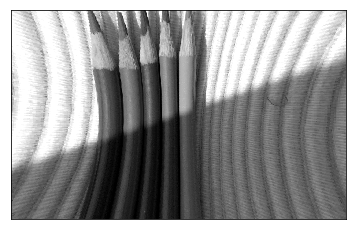

In [106]:

fig, ax = plt.subplots(1,1)
img_screen = m.natural_scene_image_to_screen(template[113,:,:])
m.show_image(img_screen, ax=ax, warp=True, mask=False, show=False)
data = [obj for obj in ax.get_children() if isinstance(obj, mpl.image.AxesImage)][0].get_array()


In [ ]:
# img_list = [68, 78, 13, 26, 6, 22, 51, 71, 111, 17, 110, 112, 103, 89, 53, 44, 8, 14, 7, 94, 9, 29, 117, 42, 10, 45, 41, 19, 114, 23, 65, 101, 96, 84, 32, 15, 115, 27, 40, 52, 93, 35 ]

img_list = range(118)

nwb_dataset = boc.get_ophys_experiment_data(511458874)
template = nwb_dataset.get_stimulus_template(si.NATURAL_SCENES).astype(np.uint8)
tmp = np.zeros((len(img_list), 1200/2, 1920/2), dtype=np.uint8)
monitor = si.BrainObservatoryMonitor()
os_dict = {}
for iii, ii in enumerate(img_list):    
    fig, ax = plt.subplots(1,1)
    img_screen = monitor.natural_scene_image_to_screen(template[ii,:,:])
    monitor.show_image(img_screen, ax=ax, warp=True, mask=False, show=False)
    data = [obj for obj in ax.get_children() if isinstance(obj, mpl.image.AxesImage)][0].get_array()

    def f(m_M):
        m = float(m_M[0])
        M = 255.-float(m_M[1])
        
        tmp = data.copy()
        tmp = (tmp-tmp.min())*(M-m)/(tmp.max()-tmp.min()) + m
        
        aa = tmp.mean()
        bb = tmp.std()/tmp.mean()
        return 100*((tmp.mean()-127.)/aa)**2 + ((tmp.std()/tmp.mean()-.6)/bb)**2

    def g(m_M):
        m = float(m_M[0])
        M = 255.-float(m_M[1])

        tmp = (data-data.min())*(M-m)/(data.max()-data.min()) + m
        return tmp.mean(), tmp.std()/tmp.mean()

    x_res = sopt.minimize(f, (0,0), bounds=((0,255),(0,255),)).x
    print x_res
    os_dict[ii] = g(x_res)
    print ii, x_res, g(x_res)
    
    m_M = x_res
    m = float(m_M[0])
    M = 255.-float(m_M[1])
    tmp2 = (data-data.min())*(M-m)/(data.max()-data.min()) + m
    

    tmp[iii,:,:] = tmp2[::2,::2][::-1,:].astype(np.uint8)
    plt.close()

np.save('/allen/aibs/technology/nicholasc/openscope/lum_match_slight_contrast.npy', tmp)

 

In [235]:
tmp = tmp[:118,:,:]

In [236]:
np.save('/allen/aibs/technology/nicholasc/openscope/lum_match_slight_contrast.npy', tmp)

In [216]:
img_screen = monitor.natural_scene_image_to_screen(tmp2)
monitor.show_image(img_screen, warp=True, mask=False, show=True)

ValueError: could not broadcast input array from shape (1200,1920) into shape (1059,1547)

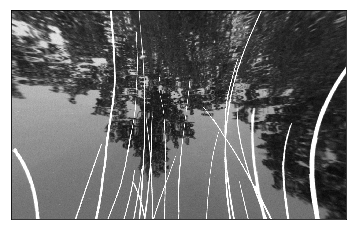

In [190]:
ii=68
fig, ax = plt.subplots(1,1)
img_screen = monitor.natural_scene_image_to_screen(template[ii,:,:])
monitor.show_image(img_screen, ax=ax, warp=True, mask=False, show=False)
data = [obj for obj in ax.get_children() if isinstance(obj, mpl.image.AxesImage)][0].get_array()

In [198]:
m_M = [  0.53156567, -82.71871494]
m = float(m_M[0])
M = 255.-float(m_M[1])
tmp = (data-data.min())*(M-m)/(data.max()-data.min()) + m
tmp.min(), tmp.max()
# plt.imshow(tmp)


(0.53156567, 337.71871494)

In [156]:
L = []
for m in range(256):
    for M in range(256):
        L.append(f((m,M)))

print min(L)

/home/nicholasc/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in double_scalars
  from ipykernel import kernelapp as app


KeyboardInterrupt: 

135.92127734375 0.5536096678282395
137.92590808823527 0.5134714751201604 10.0 250.0


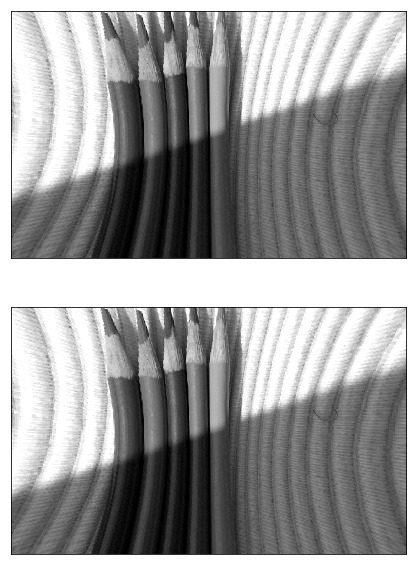

In [130]:
print data.mean(), data.std()/data.mean()



IC = data.min(), data.max()

IC0 = 


tmp = f(data, 10,250)

print tmp.mean(), tmp.std()/tmp.mean(), tmp.min(), tmp.max()


# print tmp2.mean(), tmp2.std()/tmp2.mean(), tmp2.min(), tmp2.max()

fig, ax = plt.subplots(2,1, figsize=(10,10))
m.show_image(data, ax=ax[0], warp=False, mask=False, show=False)
m.show_image(tmp, ax=ax[1], warp=False, mask=False, show=False)

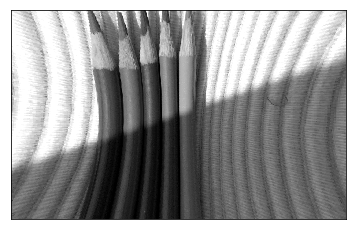

In [72]:
ax.get_children()

 Text(0.5,1,u''),
 Text(0,1,u''),
 Text(1,1,u''),

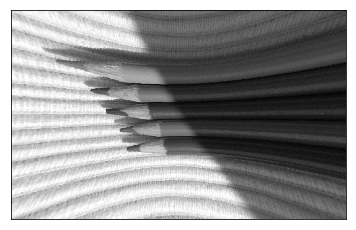

In [60]:

m.show_image(img_screen, ax=ax, warp=True, mask=False)


In [64]:
y=ax.get_children()[-2]
y.get_array().shape

(1200, 1920)

In [49]:
# tmp = np.array([img_screen])
tmp = np.array([template[114,:,:]]).astype(np.uint8)
print tmp.shape
np.save('/allen/aibs/technology/nicholasc/openscope/pencil_bob.npy', tmp)

(1, 918, 1174)


In [29]:
tmp = np.array([img_screen])
print tmp.shape
np.save('/allen/aibs/technology/nicholasc/openscope/pencil_bob_padded.npy', tmp)

(1, 1200, 1920)


In [48]:
import os
data_path = r'//allen/aibs/technology/nicholasc/openscope'
pencil_bob = np.load(os.path.join(data_path, 'pencil_bob.npy'))
nm1_data = np.load(os.path.join(data_path, '%s.npy' % 'NATURAL_MOVIE_ONE'))

print nm1_data.shape, nm1_data.dtype

print pencil_bob.shape, pencil_bob.dtype

print str(pencil_bob.dtype) == 'uint8'

# plt.imshow(pencil_bob[0,:,:])
# plt.show()

(900, 304, 608) uint8
(900, 304, 608) uint8
True


During a Brain Observatory experiment, the image on the screen (for example, above) is warped so that spherical coordinates could be displayed on a flat monitor.  When an stimulus frame is displayed without this warping, it is useful to overlay a mask of the eventual maximal extent of the stimulus that will be shown on the monitor.

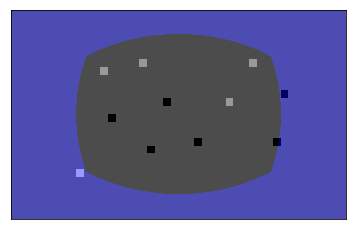

In [6]:
m = si.BrainObservatoryMonitor()
img_screen = m.lsn_image_to_screen(template)
m.show_image(img_screen, warp=False, mask=True)

Using the ```map_stimulus_coordinate_to_monitor_coordinate``` function, we can assosicate a position on the monitor (eitherpre- or post-warp) between multiple types of stimuli, despite the fact the templates for these stimuli might have different sizes and aspect ratios.

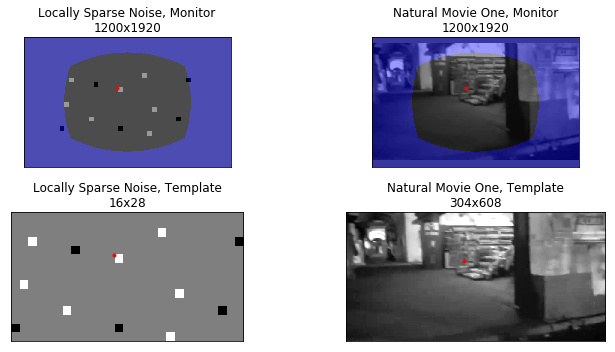

In [7]:
y0, x0 = (5,12)
y1, x1 = m.map_stimulus((y0, x0), si.LOCALLY_SPARSE_NOISE, si.NATURAL_MOVIE_ONE)
ym, xm = si.map_stimulus_coordinate_to_monitor_coordinate((y0, x0), 
                                                          (m.n_pixels_r, m.n_pixels_c), 
                                                          si.LOCALLY_SPARSE_NOISE)

img_lsn =  nwb_dataset.get_stimulus_template('locally_sparse_noise')[0,:,:]
img_movie =  nwb_dataset.get_stimulus_template('natural_movie_one')[0,:,:]


fig, ax = plt.subplots(2,2, figsize=(10,5))
natural_movie_image = m.natural_movie_image_to_screen(img_movie, origin='upper')
m.show_image(natural_movie_image, 
             ax=ax[0,1], 
             show=False, 
             origin='upper', 
             mask=True)
ax[0,1].plot([xm], [ym], 'r.')
ax[0,1].set_title('Natural Movie One, Monitor\n1200x1920')
lsn_image = m.lsn_image_to_screen(img_lsn, origin='upper')
m.show_image(lsn_image, 
             ax=ax[0,0], 
             show=False, 
             origin='upper', 
             mask=True)
ax[0,0].plot([xm], [ym], 'r.')
ax[0,0].set_title('Locally Sparse Noise, Monitor\n1200x1920')

ax[1,0].imshow(np.flipud(img_lsn), interpolation='none', cmap=plt.cm.gray, 
               extent=[0,img_lsn.shape[1],img_lsn.shape[0],0])
ax[1,0].plot([x0], [y0], 'r.')
ax[1,0].axes.get_xaxis().set_visible(False)
ax[1,0].axes.get_yaxis().set_visible(False)
ax[1,0].set_xlim((0, img_lsn.shape[1]-1))
ax[1,0].set_ylim((img_lsn.shape[0]-1, 0))
ax[1,0].set_title('Locally Sparse Noise, Template\n16x28')

ax[1,1].imshow(img_movie, interpolation='none', cmap=plt.cm.gray,
               extent=[0,img_movie.shape[1],img_movie.shape[0],0])
ax[1,1].plot([x1], [y1], 'r.')
ax[1,1].axes.get_xaxis().set_visible(False)
ax[1,1].axes.get_yaxis().set_visible(False)
ax[1,1].set_xlim((0, img_movie.shape[1]-1))
ax[1,1].set_ylim((img_movie.shape[0]-1, 0))
ax[1,1].set_title('Natural Movie One, Template\n304x608')


fig.tight_layout()

For example, in the top row of the figure above, the same position on the monitor (pre-warp) is marked in two different stimuli (left: locally sparse noise, right: natural movie).  Below, the same point is reproduced on the template image for reach stimuli. You can see that in both images, the relative location of the marked point (red) is the same in both the pre-warp monitor image and the template image. This example demonstrates how to co-register locations between stimulus sets.  

An optional `translation` argument will reposition the stimulus frame relative to a gray background canvas; translation in supplied in units of monitor pixels:

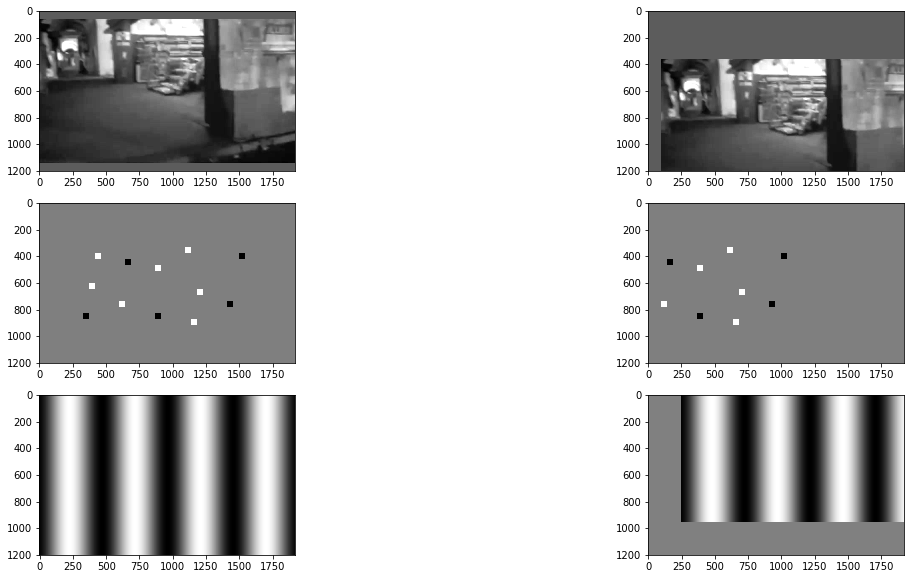

In [8]:
origin = 'upper'
img_movie =  nwb_dataset.get_stimulus_template(si.NATURAL_MOVIE_ONE)[0,:,:]
natural_movie_image = m.natural_movie_image_to_screen(img_movie, origin=origin)
natural_movie_image_translated = m.natural_movie_image_to_screen(img_movie, origin=origin, translation=(100,-300))

img_lsn =  nwb_dataset.get_stimulus_template(si.LOCALLY_SPARSE_NOISE)[0,:,:]
lsn_image = m.lsn_image_to_screen(img_lsn, origin=origin)
img_lsn_translated = m.lsn_image_to_screen(img_lsn, origin=origin, translation=(-500,0))

img_grating = m.grating_to_screen(.5,.02,0)
img_grating_translated = m.grating_to_screen(.5,.02,0, translation=(250,250))


fig, ax = plt.subplots(3,2, figsize=(20,10))
_ = ax[0,0].imshow(natural_movie_image, interpolation='none', cmap=plt.cm.gray,
                   extent=[0,natural_movie_image.shape[1],natural_movie_image.shape[0],0])
_ = ax[0,1].imshow(natural_movie_image_translated, interpolation='none', cmap=plt.cm.gray,
                   extent=[0,natural_movie_image_translated.shape[1],natural_movie_image_translated.shape[0],0])
_ = ax[1,0].imshow(lsn_image, interpolation='none', cmap=plt.cm.gray,
                   extent=[0,lsn_image.shape[1],lsn_image.shape[0],0])
_ = ax[1,1].imshow(img_lsn_translated, interpolation='none', cmap=plt.cm.gray,
                   extent=[0,img_lsn_translated.shape[1],img_lsn_translated.shape[0],0])
_ = ax[2,0].imshow(img_grating, interpolation='none', cmap=plt.cm.gray,)
_ = ax[2,1].imshow(img_grating_translated, interpolation='none', cmap=plt.cm.gray)

In [15]:
m.visual_degrees_to_pixels(10)

96.83312713166528

[15.10794308  0.        ]


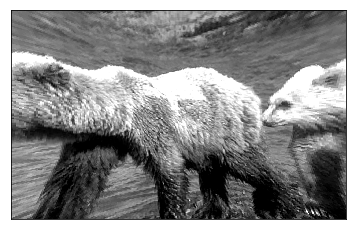

In [207]:
ii=0

fig, ax = plt.subplots(1,1)
img_screen = monitor.natural_scene_image_to_screen(template[ii,:,:])
monitor.show_image(img_screen, ax=ax, warp=True, mask=False, show=False)
data = [obj for obj in ax.get_children() if isinstance(obj, mpl.image.AxesImage)][0].get_array()

def f(x):

    xx = sorted(x)
    
    x1 = xx[0]
    x2 = xx[1]
    
#     tmp = (data-data.min())*(M-m)/(data.max()-data.min()) + m
#     aa = tmp.mean()
#     bb = tmp.std()/tmp.mean()
    return (10*(tmp.mean()-127.)/aa)**2 + ((tmp.std()/tmp.mean()-.6)/bb)**2

def g(m_M):
    m = float(m_M[0])
    M = 255.-float(m_M[1])

    tmp = (data-data.min())*(M-m)/(data.max()-data.min()) + m
    return tmp.mean(), tmp.std()/tmp.mean()

x_res = sopt.minimize(f, (255*.33, 255*.66), bounds=((0,255),(0,255))).x
print x_res

In [238]:
import glob

In [231]:
y.shape

(918, 1174)

0 120.78298611111111 0.6159509177019793 (126.39202917337536, 0.4988865134614211)
1 126.6711228298611 0.6130733473531929 (126.99991325656617, 0.600014488190255)
2 133.43667881944444 0.5705458849063985 (126.99981427980825, 0.53481063229714)
3 133.58130989583333 0.5591063122435609 (126.99999022569905, 0.5714328730992093)
4 124.42687673611111 0.5896356603856353 (125.86090783928182, 0.44640701245458936)
5 131.10662934027778 0.5494722438773098 (126.99998987439096, 0.4203887945683032)
6 130.81096484375 0.5792285768619762 (126.99996804649129, 0.5217016495228202)
7 116.40851128472222 0.6446603569505113 (125.76376325759713, 0.43866244459697523)
8 122.30935460069445 0.6232192575102137 (126.54825355032989, 0.518995281822942)
9 129.0077209201389 0.5630422976174825 (127.00000960499631, 0.5289304160958531)
10 121.07494097222222 0.6068239577331719 (126.5292357614104, 0.5165723752551011)
11 122.18714583333333 0.621993852090902 (126.23251916620764, 0.48093029890887606)
12 114.19068142361111 0.6424512583

101 125.07550477430556 0.6046213607994557 (126.72824573201045, 0.546243155885332)
102 125.00954991319445 0.5946024141588789 (127.00017440489755, 0.2994842977698471)
103 120.46392534722222 0.6291042787271802 (126.71302050658039, 0.5439547908109125)
104 127.55743229166667 0.6145314222824503 (127.0008398768689, 0.5999630923371612)
105 133.7127973090278 0.5803775911184096 (127.00051825029051, 0.5999019127489171)
106 131.67644878472223 0.5569950306549657 (126.99920319485176, 0.45692404644042794)
107 121.98420703125 0.6082834209952515 (126.17574071826817, 0.4751742458986017)
108 123.41294661458333 0.6180577805554069 (126.96064635158315, 0.5911969100668183)
109 129.77548177083332 0.569258128636315 (126.99954742934439, 0.35591976900074185)
110 129.12192057291668 0.6056428812127642 (126.99994295345526, 0.5999910542113671)
111 130.66570833333333 0.5400530416439322 (125.4860780560595, 0.41879526595609234)
112 115.72906119791666 0.5836348784996632 (125.38203596767488, 0.41207338450254516)
113 136.

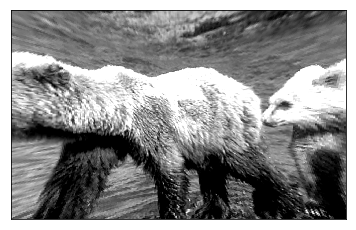

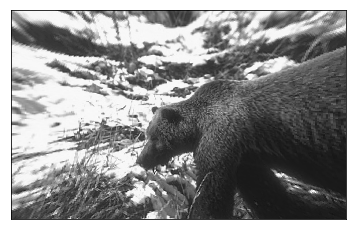

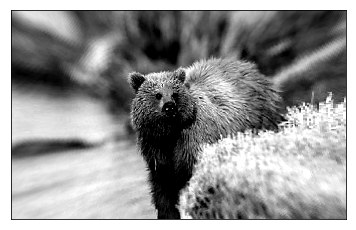

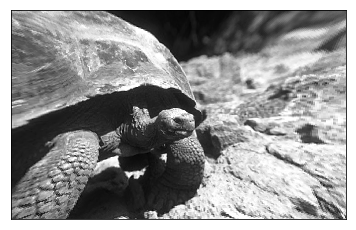

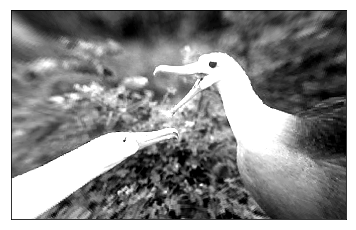

...

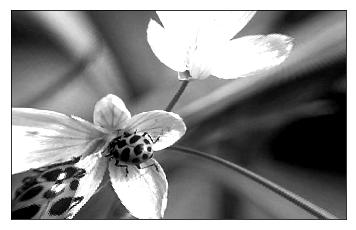

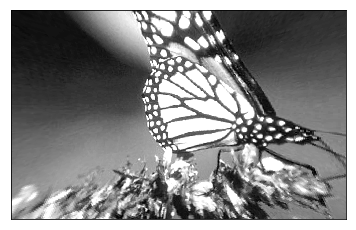

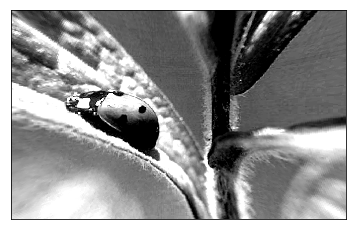

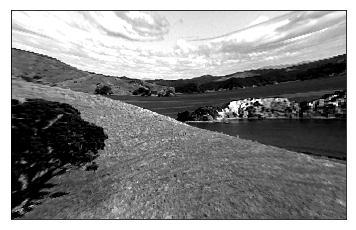

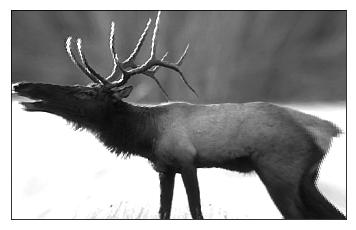

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


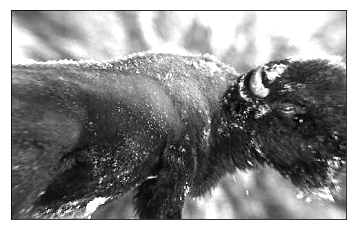

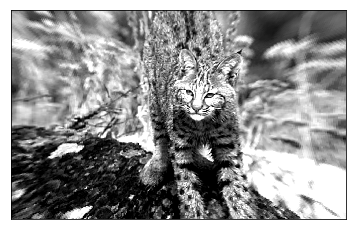

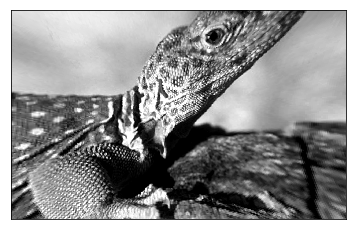

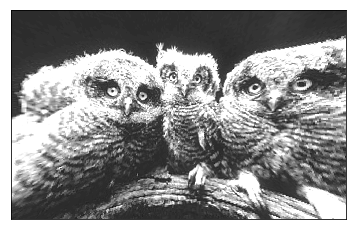

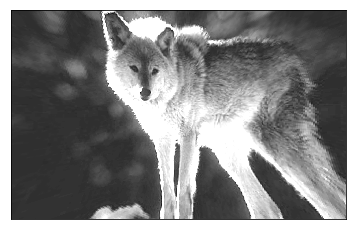

...

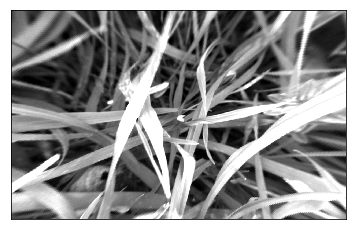

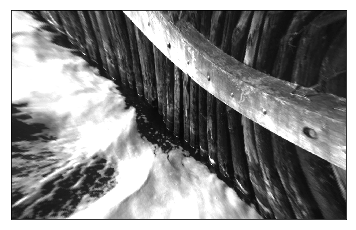

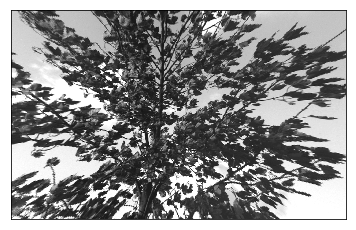

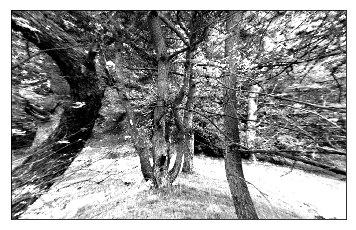

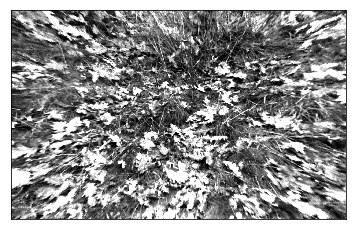

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


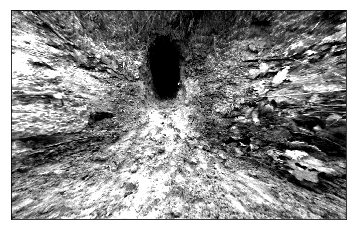

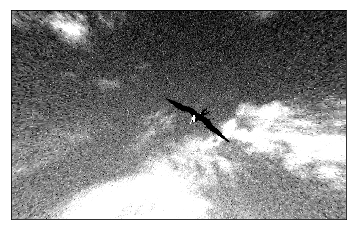

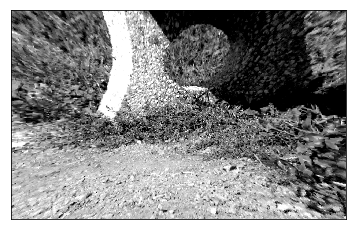

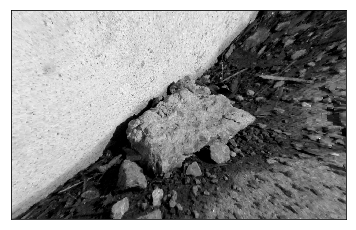

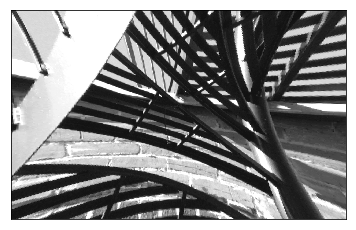

...

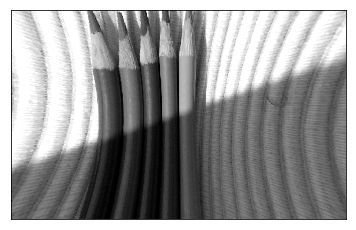

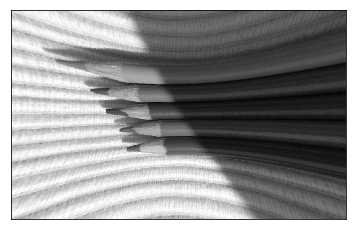

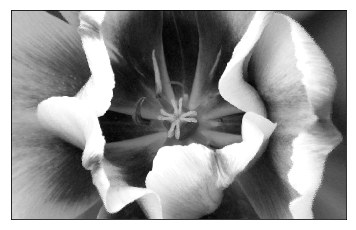

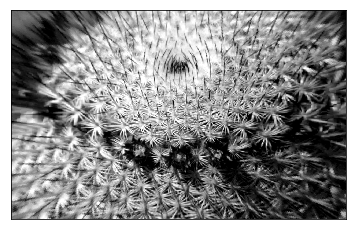

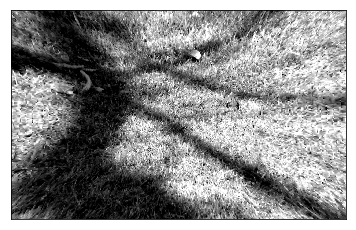

In [249]:
import PIL

for ii in range(118):
    
    tmp_str = str(ii).rjust(3,'0')
    tmp = glob.glob('/allen/programs/braintv/workgroups/cortexmodels/gocker/images/*/img_bob_%03d_*.tiff' % ii)
    if len(tmp) > 0:
        x=PIL.Image.open(tmp[0])

        x= x.resize((1174, 918))
        y=np.array(x)


        fig, ax = plt.subplots(1,1)
        img_screen = monitor.natural_scene_image_to_screen(y)
        monitor.show_image(img_screen, ax=ax, warp=True, mask=False, show=False)
        data = [obj for obj in ax.get_children() if isinstance(obj, mpl.image.AxesImage)][0].get_array()
        print ii, data.mean(), data.std()/data.mean(), os_dict[ii]

(120.78298611111111, 0.6159509177019793)

In [258]:
x.

AttributeError: 'Image' object has no attribute 'shape'